# Se monta google drive

In [1]:
# Codigo para conectarse a google drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Se copia el dataset de drive a la carpeta content

In [2]:
import shutil
import os

# Define source and destination paths
source_path = "/content/drive/MyDrive/Semestre_9/modelos_IA/dataset_gusano_cogollero"
destination_path = "/content/original_dataset"

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_path):
    os.makedirs(destination_path)

try:
    # Use shutil.copytree to copy the entire directory
    shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
    print(f"Dataset copied successfully from '{source_path}' to '{destination_path}'")
except FileNotFoundError:
    print(f"Error: Source directory '{source_path}' not found.")
except OSError as e:
    print(f"Error copying directory: {e}")

Dataset copied successfully from '/content/drive/MyDrive/Semestre_9/modelos_IA/dataset_gusano_cogollero' to '/content/original_dataset'


# Se define la variable original_dataset_directory

In [3]:
# The path of the dataset in the colab folder is defined.
original_dataset_directory = "/content/original_dataset"

# Código para mostrar cuantas imagenes hay en el dataset

## Se definen las clases del problema

In [4]:
clases = ['damaged_leaf', 'healthy_leaf', 'leaf_with_larva']

## Contar imágenes

In [5]:
import os

def contar_imagenes(clase):
    num_images = len(os.listdir(f"{original_dataset_directory}/{clase}"))
    return num_images

num_images_list = []

for clase in clases:
    num_images = contar_imagenes(clase)
    num_images_list.append(num_images)
    print(f"La carpeta {clase} tiene {num_images} imagenes")

La carpeta damaged_leaf tiene 3030 imagenes
La carpeta healthy_leaf tiene 2786 imagenes
La carpeta leaf_with_larva tiene 963 imagenes


# Mostrar algunas imágenes de las carpetas del conjunto de datos.

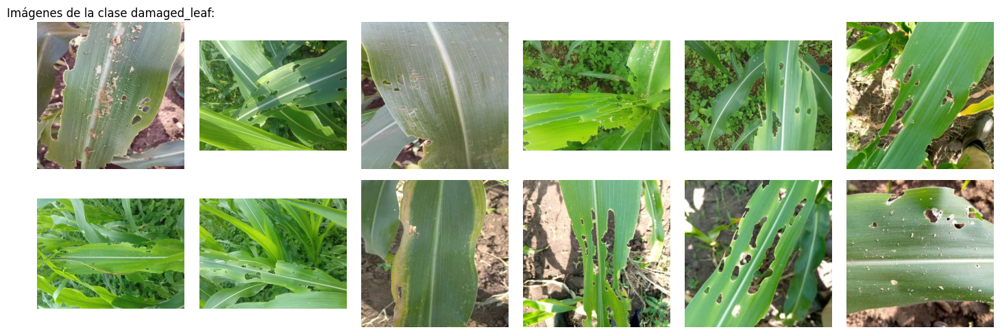

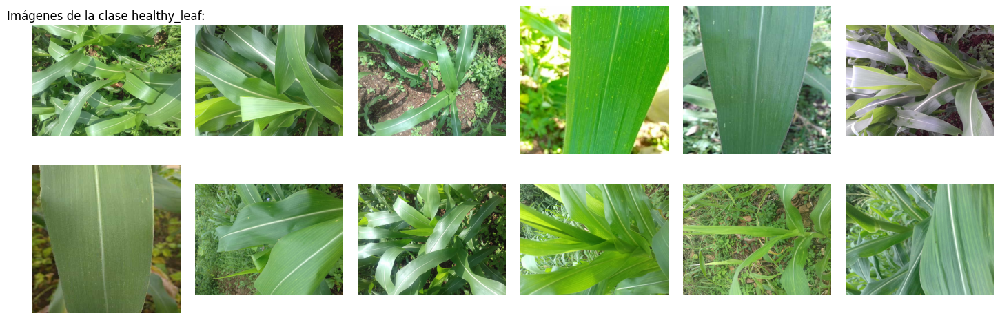

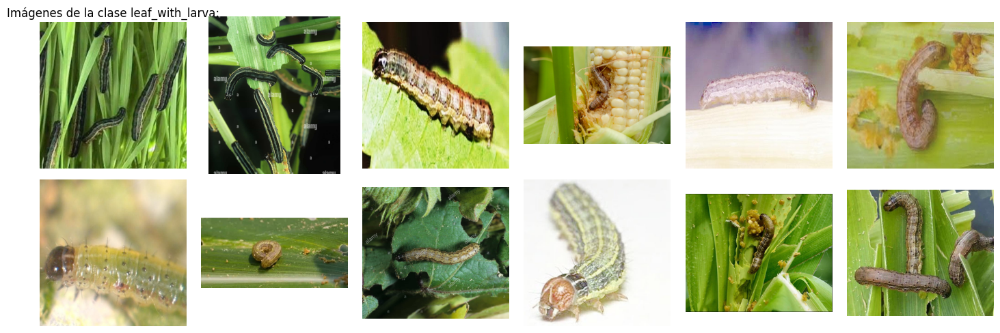

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random

def mostrar_imagenes_aleatorias(clase):
    # obtener la lista de nombres de archivos de la clase
    filenames = os.listdir(f"{original_dataset_directory}/{clase}")

    rows = 2
    cols = 6

    num_imagenes_mostrar = rows * cols  # define aquí el número de imágenes que quieres mostrar

    # seleccionar aleatoriamente 'num_imagenes_mostrar' imágenes
    selected_images = random.sample(filenames, num_imagenes_mostrar)

    fig_width = cols * 3
    fig_height = rows * 3

    fig, axes = plt.subplots(rows, cols, figsize=(fig_width, fig_height))

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(original_dataset_directory, clase, image_file)
        img = mpimg.imread(image_path)
        ax = axes[i // cols, i % cols]
        ax.imshow(img)
        ax.axis('off')
        if i == 0:
          ax.set_title(f"Imágenes de la clase {clase}:")  # establece el título del subplot

    # Eliminar los ejes sobrantes si hay menos imágenes que la capacidad de la cuadrícula
    if num_imagenes_mostrar < rows * cols:
        for i in range(num_imagenes_mostrar, rows * cols):
            axes[i // cols, i % cols].axis('off')

    plt.subplots_adjust(wspace=0.1, hspace=0)
    plt.show()

# mostrar imágenes para cada clase
for clase in clases:
    mostrar_imagenes_aleatorias(clase)

# Este código elige la carpeta con el menor número de imágenes para equilibrar todas las carpetas con ese número

In [7]:
min_num_images = min(num_images_list)
print(f"La clase con menor número de imagenes tiene {min_num_images} imágenes")

La clase con menor número de imagenes tiene 963 imágenes


# Este código es para eliminar imágenes adicionales con una semilla

In [8]:
import random

# Generar y guardar la semilla aleatoria
random_seed = random.randint(1, 10000)
random.seed(random_seed)

# Ruta a la carpeta raíz
root_folder = original_dataset_directory

# Número objetivo de imágenes
target_count = min_num_images

print(f"Usando semilla aleatoria: {random_seed}")

# Iterar sobre las subcarpetas
for folder in clases:
    # Ruta completa a la subcarpeta
    folder_path = os.path.join(root_folder, folder)

    # Obtener la lista de archivos en la subcarpeta
    file_list = os.listdir(folder_path)

    # Calcular el número de imágenes a eliminar
    images_to_remove = len(file_list) - target_count

    if images_to_remove <= 0:
        continue

    # Seleccionar imágenes al azar para eliminar
    images_to_delete = random.sample(file_list, images_to_remove)

    # Eliminar las imágenes seleccionadas
    for image in images_to_delete:
        image_path = os.path.join(folder_path, image)
        os.remove(image_path)

    print(f"Eliminadas {len(images_to_delete)} imágenes en la carpeta '{folder}'")

# Guardar la semilla en un archivo de texto
with open('random_seed.txt', 'w') as f:
    f.write(f"Semilla aleatoria utilizada: {random_seed}")

Usando semilla aleatoria: 8956
Eliminadas 2067 imágenes en la carpeta 'damaged_leaf'
Eliminadas 1823 imágenes en la carpeta 'healthy_leaf'


# Este código es para verificar cuántas imágenes quedan en las carpetas de entrenamiento.

In [10]:
for clase in clases:
    num_images = contar_imagenes(clase)
    print(f"La carpeta {clase} tiene {num_images} imagenes")

La carpeta damaged_leaf tiene 963 imagenes
La carpeta healthy_leaf tiene 963 imagenes
La carpeta leaf_with_larva tiene 963 imagenes


# Dividir el conjunto de datos original en training, validation y test.

## Eliminar la carpeta dataset si es necesario

In [ ]:
!rm -rf /content/dataset/

## Dividir el dataset

In [11]:
import os
import random
import shutil

# Define las proporciones para cada conjunto
train_ratio = 0.7
validation_ratio = 0.15
test_ratio = 0.15

# Directorio del dataset original
original_dataset_directory = "/content/original_dataset"

# Directorio del dataset de trabajo
dataset_directory = "/content/dataset"

# Crear el directorio del dataset de trabajo si no existe
os.makedirs(dataset_directory, exist_ok=True)

# Directorios para los conjuntos de datos
train_dir = os.path.join(dataset_directory, "train")
validation_dir = os.path.join(dataset_directory, "validation")
test_dir = os.path.join(dataset_directory, "test")

# Crear los directorios si no existen
os.makedirs(train_dir, exist_ok=True)
os.makedirs(validation_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Iterar sobre las clases
clases = ['damaged_leaf', 'healthy_leaf', 'leaf_with_larva']
for clase in clases:
    # Crear directorios para cada clase en cada conjunto
    os.makedirs(os.path.join(train_dir, clase), exist_ok=True)
    os.makedirs(os.path.join(validation_dir, clase), exist_ok=True)
    os.makedirs(os.path.join(test_dir, clase), exist_ok=True)

    # Obtener la lista de imágenes para la clase actual desde el directorio original
    image_files = [f for f in os.listdir(os.path.join(original_dataset_directory, clase)) if os.path.isfile(os.path.join(original_dataset_directory, clase, f))]
    random.shuffle(image_files)

    # Calcular el número de imágenes para cada conjunto
    num_train = int(len(image_files) * train_ratio)
    num_validation = int(len(image_files) * validation_ratio)
    num_test = len(image_files) - num_train - num_validation

    # Dividir las imágenes en los conjuntos
    train_images = image_files[:num_train]
    validation_images = image_files[num_train:num_train + num_validation]
    test_images = image_files[num_train + num_validation:]

    # Copiar las imágenes a los directorios correspondientes
    for image in train_images:
        source_path = os.path.join(original_dataset_directory, clase, image)
        destination_path = os.path.join(train_dir, clase, image)
        shutil.copy(source_path, destination_path)  # Usar shutil.copy en lugar de shutil.move para mantener el dataset original
    for image in validation_images:
        source_path = os.path.join(original_dataset_directory, clase, image)
        destination_path = os.path.join(validation_dir, clase, image)
        shutil.copy(source_path, destination_path)
    for image in test_images:
        source_path = os.path.join(original_dataset_directory, clase, image)
        destination_path = os.path.join(test_dir, clase, image)
        shutil.copy(source_path, destination_path)

    print(f"Clase {clase}: {len(train_images)} imágenes para entrenamiento, {len(validation_images)} para validación y {len(test_images)} para pruebas.")


Clase damaged_leaf: 674 imágenes para entrenamiento, 144 para validación y 145 para pruebas.
Clase healthy_leaf: 674 imágenes para entrenamiento, 144 para validación y 145 para pruebas.
Clase leaf_with_larva: 674 imágenes para entrenamiento, 144 para validación y 145 para pruebas.


# Aumentar el dataset

## Eliminar carpeta de datos aumentados si es necesario

In [ ]:
!rm -rf /content/dataset/augmented_train/

# Ejecutar el aumento de datos

In [12]:
import os
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Directorio de imágenes de entrenamiento
train_data_dir = '/content/dataset/train'

# Directorio de destino para las imágenes aumentadas
augmented_train_dir = '/content/dataset/augmented_train'
os.makedirs(augmented_train_dir, exist_ok=True)

# Factor de aumento
augmentation_factor = 5

# Crear un generador de datos de imagen
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Tamaño objetivo de las imágenes
target_size = (384, 384)

# Obtener las clases a partir de los subdirectorios en el directorio de entrenamiento
clases = [d for d in os.listdir(train_data_dir) if os.path.isdir(os.path.join(train_data_dir, d))]

# Iterar sobre las clases
for clase in clases:
    clase_dir = os.path.join(train_data_dir, clase)
    image_files = [f for f in os.listdir(clase_dir) if os.path.isfile(os.path.join(clase_dir, f))]

    # Crear subdirectorio para cada clase en el directorio de imágenes aumentadas
    augmented_dir = os.path.join(augmented_train_dir, clase)
    os.makedirs(augmented_dir, exist_ok=True)

    # Procesar cada imagen
    for image_file in image_files:
        img_path = os.path.join(clase_dir, image_file)
        # Copiar la imagen original al directorio de aumento
        shutil.copy(img_path, augmented_dir)
        img = load_img(img_path, target_size=target_size)
        img = img_to_array(img)
        img = img.reshape((1,) + img.shape)

        # Generar imágenes aumentadas
        i = 0
        for batch in datagen.flow(img,
                                  save_to_dir=augmented_dir,
                                  save_prefix=f'{os.path.splitext(image_file)[0]}_augmented',
                                  save_format='jpeg'):
            i += 1
            if i >= augmentation_factor - 1:
                break

# Obtener la lista de imágenes en la carpeta
images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(augmented_train_dir) for f in filenames if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Imprimir el número de imágenes
print(f"El número total de imágenes aumentadas es: {len(images)}")


El número total de imágenes aumentadas es: 10107


# Balancear el número de imágenes aumentadas por clase

In [13]:
import os

# Directorio de imágenes aumentadas
augmented_train_dir = 'dataset/augmented_train'

# Obtener el conteo de imágenes por clase
class_counts = {}
for clase in clases:
    class_dir = os.path.join(augmented_train_dir, clase)
    num_images = len(os.listdir(class_dir))
    class_counts[clase] = num_images
    print(f"Inicialmente, clase {clase} tiene {num_images} imágenes")

# Encontrar la clase con menor número de imágenes
min_count = min(class_counts.values())
print(f"\nIgualando todas las clases a {min_count} imágenes...")

# Ajustar cada clase al mínimo eliminando imágenes extras
for clase in clases:
    class_dir = os.path.join(augmented_train_dir, clase)
    current_count = class_counts[clase]

    if current_count > min_count:
        # Obtener lista de archivos y ordenarlos
        files = sorted(os.listdir(class_dir))
        # Calcular cuántas imágenes eliminar
        num_to_remove = current_count - min_count
        # Eliminar las últimas imágenes
        for file_name in files[-num_to_remove:]:
            os.remove(os.path.join(class_dir, file_name))
        print(f"Se eliminaron {num_to_remove} imágenes de la clase {clase}")

# Verificar el resultado final
print("\nConteo final de imágenes:")
for clase in clases:
    num_images = len(os.listdir(os.path.join(augmented_train_dir, clase)))
    print(f"Clase {clase} tiene {num_images} imágenes")

Inicialmente, clase leaf_with_larva tiene 3369 imágenes
Inicialmente, clase healthy_leaf tiene 3368 imágenes
Inicialmente, clase damaged_leaf tiene 3370 imágenes

Igualando todas las clases a 3368 imágenes...
Se eliminaron 1 imágenes de la clase leaf_with_larva
Se eliminaron 2 imágenes de la clase damaged_leaf

Conteo final de imágenes:
Clase leaf_with_larva tiene 3368 imágenes
Clase healthy_leaf tiene 3368 imágenes
Clase damaged_leaf tiene 3368 imágenes


# Este código imprime algunas imágenes de las imágenes aumentadas.

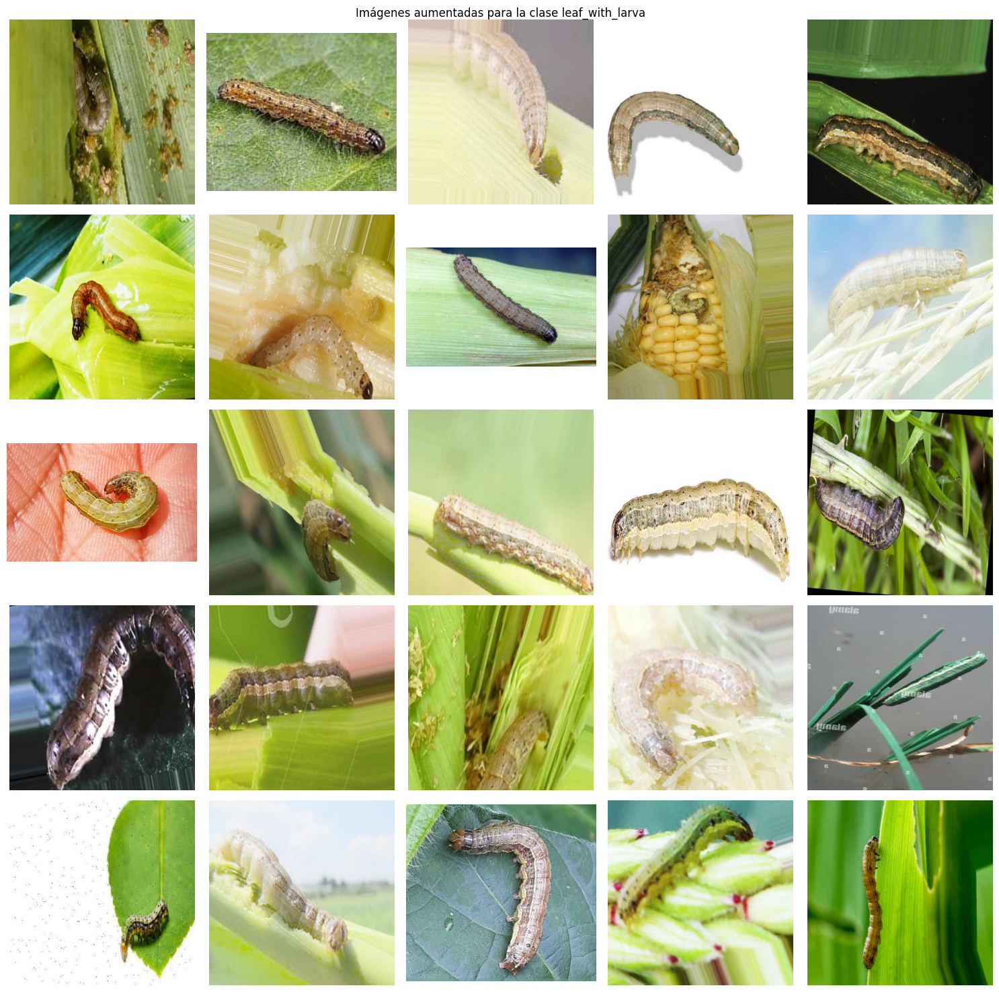

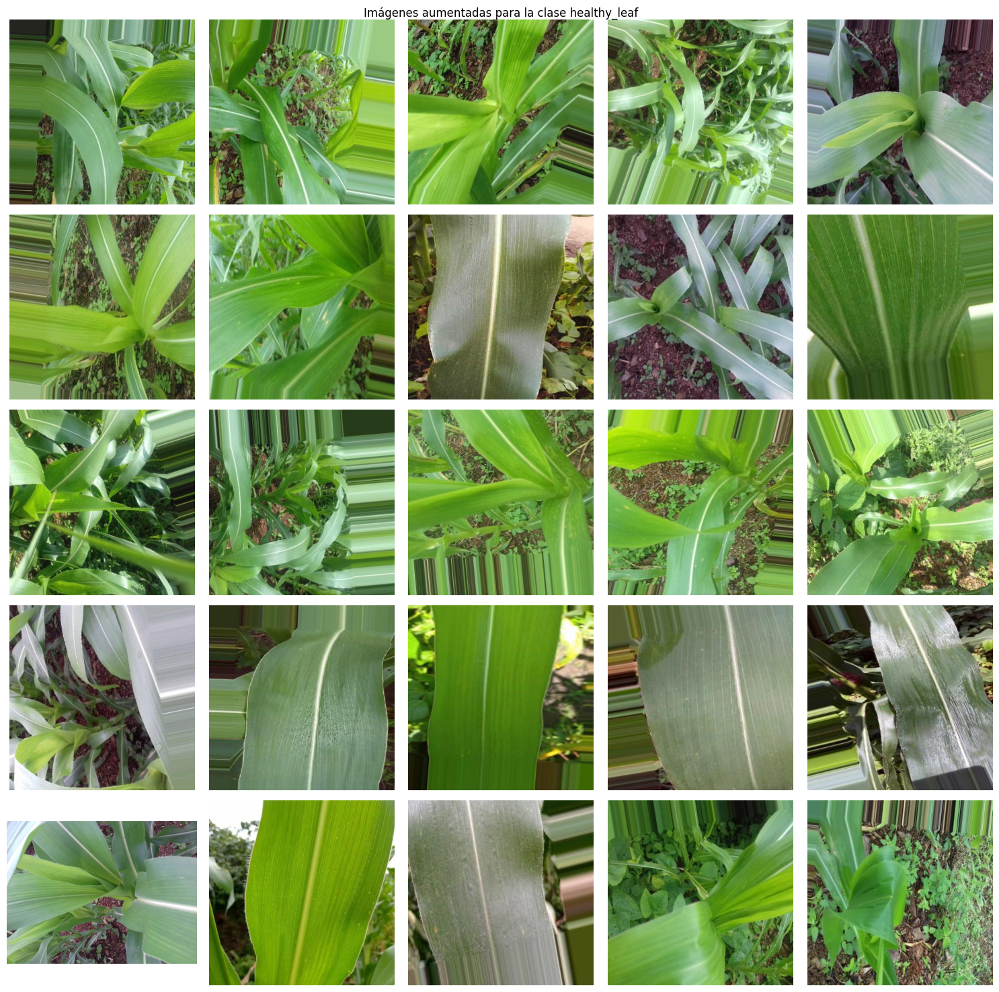

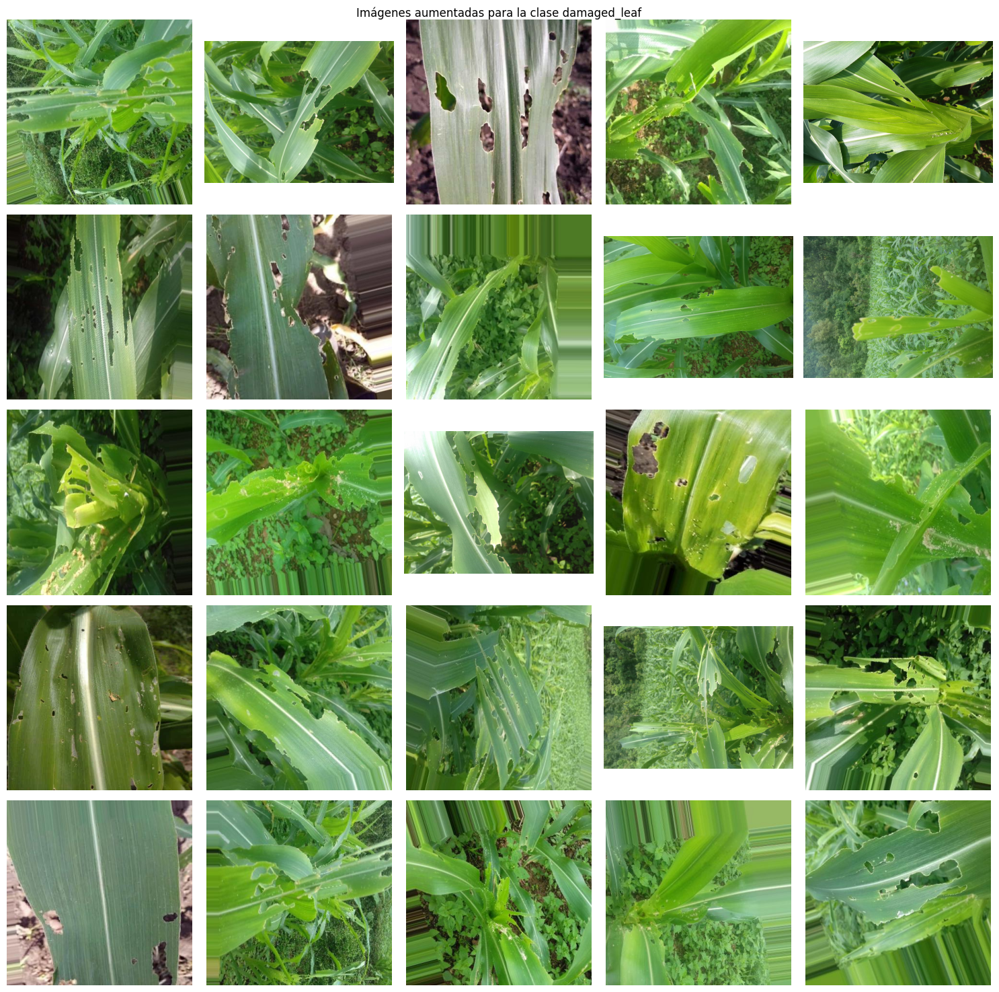

In [14]:
import matplotlib.pyplot as plt
import os

# Directorio de imágenes de entrenamiento
train_data_dir = 'dataset/augmented_train'

# Función para mostrar imágenes en una cuadrícula
def mostrar_imagenes_aumentadas(clase, filas=3, columnas=3):
    augmented_dir = os.path.join(train_data_dir, clase)
    image_files = [f for f in os.listdir(augmented_dir) if os.path.isfile(os.path.join(augmented_dir, f))]

    if not image_files:
        print(f"No se encontraron imágenes aumentadas para la clase {clase}.")
        return

    num_imagenes = min(filas * columnas, len(image_files))  # Asegurarse de no mostrar más imágenes que las disponibles

    fig, axes = plt.subplots(filas, columnas, figsize=(columnas * 3, filas * 3))  # Ajustar el tamaño de la figura
    axes = axes.flatten()  # Aplanar los ejes para poder iterar fácilmente

    for i in range(num_imagenes):
        image_path = os.path.join(augmented_dir, image_files[i])
        img = plt.imread(image_path)
        axes[i].imshow(img)
        axes[i].axis('off')

    # Ocultar ejes restantes si hay menos imágenes que espacios en la cuadrícula
    for j in range(num_imagenes, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Imágenes aumentadas para la clase {clase}")  # Título general
    plt.tight_layout()
    plt.show()

# Mostrar imágenes aumentadas para cada clase
for clase in clases:
    mostrar_imagenes_aumentadas(clase, filas=5, columnas=5)

# Se descarga el modelo pre-entrenado

## descargar librería timm

In [17]:
!pip install timm
import timm

## Descarga y creación del modelo

In [16]:
model_name = 'caformer_s18.sail_in22k_ft_in1k_384'
model = timm.create_model(model_name, pretrained=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/105M [00:00<?, ?B/s]

## Imprimir número de parametros del modelo

In [18]:
# Imprimir el número de parámetros
total_params = sum(p.numel() for p in model.parameters())
print("\nOriginal number of parameters:", total_params)



Original number of parameters: 26341656


# Congelar las capas del modelo base

In [19]:
# Determinar cuántos grupos de parámetros tiene el modelo
param_groups = list(model.parameters())

# Determinar cuantas capas se quieren congelar
target_len = int(len(param_groups) * 0.99)

# Congelar las capas
for param in param_groups[:target_len]:
    param.requires_grad = False

# Adaptación del modelo al número de clases

In [20]:
import torch
from torch import nn

In [21]:
# Primero, veamos la estructura de la cabeza del modelo
print(model.head)

Sequential(
  (global_pool): SelectAdaptivePool2d(pool_type=avg, flatten=Identity())
  (norm): LayerNorm2d((512,), eps=1e-06, elementwise_affine=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (drop): Dropout(p=0.0, inplace=False)
  (fc): MlpHead(
    (fc1): Linear(in_features=512, out_features=2048, bias=True)
    (act): SquaredReLU(
      (relu): ReLU()
    )
    (norm): LayerNorm((2048,), eps=1e-06, elementwise_affine=True)
    (fc2): Linear(in_features=2048, out_features=1000, bias=True)
    (head_drop): Dropout(p=0.0, inplace=False)
  )
)


In [22]:
# Configurar el modelo para adaptarlo al número de clases
num_classes = len(clases)

# Obtener el número de características de entrada
in_features = model.head.fc.fc1.in_features

# Crear una nueva cabeza más simple manteniendo las capas necesarias
class NewHead(nn.Module):
    def __init__(self, in_features, num_classes):
        super().__init__()
        self.global_pool = model.head.global_pool
        self.norm = model.head.norm
        self.flatten = model.head.flatten
        self.drop = model.head.drop
        self.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        x = self.global_pool(x)
        x = self.norm(x)
        x = self.flatten(x)
        x = self.drop(x)
        x = self.fc(x)
        return x

# Reemplazar la cabeza del modelo
model.head = NewHead(in_features, num_classes)

# Cantidad de clases de salida y Nueva estructura de la cabeza del modelo

In [23]:
# Verificación
print(f"Número de clases esperado: {num_classes}")
print(f"Dimensiones de la última capa: {model.head.fc.out_features}")

# Mostrar la nueva estructura de la nueva cabeza
print("\nNueva Estructura de la nueva cabeza del modelo:")
print(model.head)

Número de clases esperado: 3
Dimensiones de la última capa: 3

Nueva Estructura de la nueva cabeza del modelo:
NewHead(
  (global_pool): SelectAdaptivePool2d(pool_type=avg, flatten=Identity())
  (norm): LayerNorm2d((512,), eps=1e-06, elementwise_affine=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (drop): Dropout(p=0.0, inplace=False)
  (fc): Linear(in_features=512, out_features=3, bias=True)
)


# Funciones de perdida, optimizador

## Optimizador Lamb

In [24]:
!pip install torch_optimizer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 6.1 MB/s eta 0:00:00


In [25]:
# Función de pérdida y optimizador
import torch_optimizer as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Lamb(model.parameters(), lr=0.0001)

# Selección del Dispositivo de Cómputo (CPU o GPU)

In [26]:
# Mover el modelo a GPU si está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
criterion = criterion.to(device)

# Se muestra el número de parámetros del modelo

In [27]:
# Función para calcular el número total de parámetros
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

# Función para calcular el número de parámetros entrenables
def count_trainable_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

total_params = count_parameters(model)
trainable_params = count_trainable_parameters(model)

print(f"Total number of parameters: {total_params}")
print(f"Number of trainable parameters: {trainable_params}")
print(f"Number of non-trainable parameters: {total_params - trainable_params}")

Total number of parameters: 23239475
Number of trainable parameters: 1539
Number of non-trainable parameters: 23237936


# Se configuran los dataloaders

In [28]:
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

# Transformaciones (puedes ajustarlas según tus necesidades)
transform = transforms.Compose([
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
    transforms.Normalize(timm.data.IMAGENET_DEFAULT_MEAN, timm.data.IMAGENET_DEFAULT_STD)
])

# Cargar conjuntos de datos
train_dataset = ImageFolder(root='/content/dataset/augmented_train', transform=transform)
valid_dataset = ImageFolder(root='/content/dataset/validation', transform=transform)
test_dataset = ImageFolder(root='/content/dataset/test', transform=transform)

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

# Configuración de funciones de entrenamiento y validación por época para Caformer

In [29]:
from tqdm import tqdm

def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    progress_bar = tqdm(train_loader, desc="Training")
    for inputs, labels in progress_bar:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total_predictions += labels.size(0)
        correct_predictions += (predicted == labels).sum().item()
        progress_bar.set_postfix({'loss': loss.item()})

    epoch_loss = running_loss / total_predictions
    epoch_acc = correct_predictions / total_predictions
    return epoch_loss, epoch_acc


def validate_epoch(model, valid_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total_predictions += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

    epoch_loss = running_loss / total_predictions
    epoch_acc = correct_predictions / total_predictions
    return epoch_loss, epoch_acc

# Función para entrenar y evaluar todas las épocas del modelo Caformer

In [30]:
def train_and_evaluate_caformer(model, train_loader, valid_loader, criterion, optimizer, device, num_epochs=10, patience=3):
    best_val_loss = float('inf')
    epochs_no_improve = 0
    train_loss_history = []
    train_acc_history = []
    valid_loss_history = []
    valid_acc_history = []

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
        valid_loss, valid_acc = validate_epoch(model, valid_loader, criterion, device)

        train_loss_history.append(train_loss)
        train_acc_history.append(train_acc)
        valid_loss_history.append(valid_loss)
        valid_acc_history.append(valid_acc)

        print(f"Train Loss: {train_loss:.5f}, Train Acc: {train_acc:.5f}")
        print(f"Valid Loss: {valid_loss:.5f}, Valid Acc: {valid_acc:.5f}")

        # Save history after each epoch
        history = {
            'train_loss': train_loss_history,
            'train_acc': train_acc_history,
            'valid_loss': valid_loss_history,
            'valid_acc': valid_acc_history,
            'current_epoch': epoch + 1
        }
        torch.save(history, 'training_history.pth')

        if valid_loss < best_val_loss:
            best_val_loss = valid_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            epochs_no_improve += 1

        if epochs_no_improve == patience:
            print(f"Early stopping after {epoch+1} epochs.")
            break

    return train_loss_history, train_acc_history, valid_loss_history, valid_acc_history

# Entrenamiento del modelo CaFormer

In [31]:
# Entrenamiento del modelo CaFormer
num_epochs = 100  # Número de épocas para entrenar
patience = 15
train_loss_history, train_acc_history, valid_loss_history, valid_acc_history = train_and_evaluate_caformer(
    model, train_loader, valid_loader, criterion, optimizer, device, num_epochs=num_epochs, patience = patience
)

Epoch 1/100


Training: 100%|██████████| 316/316 [01:27<00:00,  3.61it/s, loss=0.937]


Train Loss: 1.07726, Train Acc: 0.41607
Valid Loss: 0.98163, Valid Acc: 0.55093
Epoch 2/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.02it/s, loss=0.858]


Train Loss: 0.94575, Train Acc: 0.61015
Valid Loss: 0.87047, Valid Acc: 0.65972
Epoch 3/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.812]


Train Loss: 0.83646, Train Acc: 0.70546
Valid Loss: 0.77787, Valid Acc: 0.68056
Epoch 4/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.02it/s, loss=0.653]


Train Loss: 0.74474, Train Acc: 0.75445
Valid Loss: 0.69968, Valid Acc: 0.75231
Epoch 5/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.553]


Train Loss: 0.66812, Train Acc: 0.79127
Valid Loss: 0.63461, Valid Acc: 0.80787
Epoch 6/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.93it/s, loss=0.61]


Train Loss: 0.60403, Train Acc: 0.82354
Valid Loss: 0.57998, Valid Acc: 0.84028
Epoch 7/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.91it/s, loss=0.598]


Train Loss: 0.55079, Train Acc: 0.85115
Valid Loss: 0.53307, Valid Acc: 0.87037
Epoch 8/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.91it/s, loss=0.384]


Train Loss: 0.50512, Train Acc: 0.87213
Valid Loss: 0.49225, Valid Acc: 0.90278
Epoch 9/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.405]


Train Loss: 0.46589, Train Acc: 0.89004
Valid Loss: 0.45718, Valid Acc: 0.91204
Epoch 10/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.96it/s, loss=0.446]


Train Loss: 0.43189, Train Acc: 0.89895
Valid Loss: 0.42576, Valid Acc: 0.92130
Epoch 11/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.98it/s, loss=0.374]


Train Loss: 0.40233, Train Acc: 0.90736
Valid Loss: 0.39849, Valid Acc: 0.93056
Epoch 12/100


Training: 100%|██████████| 316/316 [01:51<00:00,  2.83it/s, loss=0.388]


Train Loss: 0.37645, Train Acc: 0.91261
Valid Loss: 0.37410, Valid Acc: 0.93287
Epoch 13/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.317]


Train Loss: 0.35337, Train Acc: 0.92063
Valid Loss: 0.35238, Valid Acc: 0.93519
Epoch 14/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.303]


Train Loss: 0.33286, Train Acc: 0.92389
Valid Loss: 0.33272, Valid Acc: 0.94213
Epoch 15/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.196]


Train Loss: 0.31453, Train Acc: 0.92835
Valid Loss: 0.31492, Valid Acc: 0.94213
Epoch 16/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.286]


Train Loss: 0.29802, Train Acc: 0.93112
Valid Loss: 0.29898, Valid Acc: 0.94676
Epoch 17/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.368]


Train Loss: 0.28296, Train Acc: 0.93399
Valid Loss: 0.28382, Valid Acc: 0.95139
Epoch 18/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.95it/s, loss=0.172]


Train Loss: 0.26931, Train Acc: 0.93557
Valid Loss: 0.27064, Valid Acc: 0.95370
Epoch 19/100


Training: 100%|██████████| 316/316 [01:42<00:00,  3.09it/s, loss=0.322]


Train Loss: 0.25688, Train Acc: 0.93775
Valid Loss: 0.25825, Valid Acc: 0.95833
Epoch 20/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.296]


Train Loss: 0.24539, Train Acc: 0.93943
Valid Loss: 0.24667, Valid Acc: 0.95833
Epoch 21/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.01it/s, loss=0.285]


Train Loss: 0.23490, Train Acc: 0.94181
Valid Loss: 0.23587, Valid Acc: 0.96065
Epoch 22/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.90it/s, loss=0.235]


Train Loss: 0.22517, Train Acc: 0.94319
Valid Loss: 0.22631, Valid Acc: 0.95833
Epoch 23/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.141]


Train Loss: 0.21614, Train Acc: 0.94438
Valid Loss: 0.21706, Valid Acc: 0.95833
Epoch 24/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.92it/s, loss=0.26]


Train Loss: 0.20782, Train Acc: 0.94735
Valid Loss: 0.20853, Valid Acc: 0.96065
Epoch 25/100


Training: 100%|██████████| 316/316 [01:41<00:00,  3.11it/s, loss=0.326]


Train Loss: 0.20022, Train Acc: 0.94814
Valid Loss: 0.20087, Valid Acc: 0.96528
Epoch 26/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.121]


Train Loss: 0.19294, Train Acc: 0.95032
Valid Loss: 0.19341, Valid Acc: 0.96759
Epoch 27/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.17]


Train Loss: 0.18613, Train Acc: 0.95150
Valid Loss: 0.18692, Valid Acc: 0.96759
Epoch 28/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.125]


Train Loss: 0.17982, Train Acc: 0.95259
Valid Loss: 0.18033, Valid Acc: 0.96991
Epoch 29/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.03it/s, loss=0.121]


Train Loss: 0.17395, Train Acc: 0.95348
Valid Loss: 0.17396, Valid Acc: 0.96991
Epoch 30/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.256]


Train Loss: 0.16841, Train Acc: 0.95487
Valid Loss: 0.16866, Valid Acc: 0.96991
Epoch 31/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.96it/s, loss=0.137]


Train Loss: 0.16324, Train Acc: 0.95596
Valid Loss: 0.16337, Valid Acc: 0.97222
Epoch 32/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.388]


Train Loss: 0.15829, Train Acc: 0.95794
Valid Loss: 0.15815, Valid Acc: 0.97222
Epoch 33/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.169]


Train Loss: 0.15365, Train Acc: 0.95913
Valid Loss: 0.15362, Valid Acc: 0.97454
Epoch 34/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.93it/s, loss=0.13]


Train Loss: 0.14924, Train Acc: 0.95952
Valid Loss: 0.14941, Valid Acc: 0.97454
Epoch 35/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.118]


Train Loss: 0.14511, Train Acc: 0.96160
Valid Loss: 0.14576, Valid Acc: 0.97454
Epoch 36/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.02it/s, loss=0.0891]


Train Loss: 0.14114, Train Acc: 0.96239
Valid Loss: 0.14157, Valid Acc: 0.97685
Epoch 37/100


Training: 100%|██████████| 316/316 [01:43<00:00,  3.05it/s, loss=0.0794]


Train Loss: 0.13725, Train Acc: 0.96318
Valid Loss: 0.13720, Valid Acc: 0.97685
Epoch 38/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.173]


Train Loss: 0.13374, Train Acc: 0.96348
Valid Loss: 0.13407, Valid Acc: 0.97685
Epoch 39/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.297]


Train Loss: 0.13031, Train Acc: 0.96417
Valid Loss: 0.13088, Valid Acc: 0.97685
Epoch 40/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.0834]


Train Loss: 0.12692, Train Acc: 0.96625
Valid Loss: 0.12747, Valid Acc: 0.97685
Epoch 41/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.03it/s, loss=0.118]


Train Loss: 0.12382, Train Acc: 0.96615
Valid Loss: 0.12476, Valid Acc: 0.97685
Epoch 42/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.101]


Train Loss: 0.12086, Train Acc: 0.96704
Valid Loss: 0.12212, Valid Acc: 0.97685
Epoch 43/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.175]


Train Loss: 0.11806, Train Acc: 0.96744
Valid Loss: 0.11926, Valid Acc: 0.97685
Epoch 44/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.131]


Train Loss: 0.11534, Train Acc: 0.96853
Valid Loss: 0.11669, Valid Acc: 0.97917
Epoch 45/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.145]


Train Loss: 0.11268, Train Acc: 0.96853
Valid Loss: 0.11424, Valid Acc: 0.97917
Epoch 46/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.0868]


Train Loss: 0.11026, Train Acc: 0.96932
Valid Loss: 0.11265, Valid Acc: 0.98148
Epoch 47/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.199]


Train Loss: 0.10791, Train Acc: 0.97080
Valid Loss: 0.11000, Valid Acc: 0.97917
Epoch 48/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.93it/s, loss=0.0974]


Train Loss: 0.10564, Train Acc: 0.97080
Valid Loss: 0.10828, Valid Acc: 0.98148
Epoch 49/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.0735]


Train Loss: 0.10354, Train Acc: 0.97120
Valid Loss: 0.10621, Valid Acc: 0.98148
Epoch 50/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.101]


Train Loss: 0.10142, Train Acc: 0.97219
Valid Loss: 0.10479, Valid Acc: 0.98380
Epoch 51/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.115]


Train Loss: 0.09935, Train Acc: 0.97229
Valid Loss: 0.10322, Valid Acc: 0.98380
Epoch 52/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.03it/s, loss=0.0749]


Train Loss: 0.09751, Train Acc: 0.97387
Valid Loss: 0.10142, Valid Acc: 0.98380
Epoch 53/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.98it/s, loss=0.0545]


Train Loss: 0.09568, Train Acc: 0.97447
Valid Loss: 0.09970, Valid Acc: 0.98380
Epoch 54/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.01it/s, loss=0.0835]


Train Loss: 0.09388, Train Acc: 0.97456
Valid Loss: 0.09800, Valid Acc: 0.98148
Epoch 55/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.0551]


Train Loss: 0.09220, Train Acc: 0.97437
Valid Loss: 0.09687, Valid Acc: 0.98380
Epoch 56/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.0516]


Train Loss: 0.09046, Train Acc: 0.97536
Valid Loss: 0.09550, Valid Acc: 0.98148
Epoch 57/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.0793]


Train Loss: 0.08883, Train Acc: 0.97506
Valid Loss: 0.09423, Valid Acc: 0.98380
Epoch 58/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.95it/s, loss=0.0842]


Train Loss: 0.08733, Train Acc: 0.97585
Valid Loss: 0.09318, Valid Acc: 0.98380
Epoch 59/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.91it/s, loss=0.0539]


Train Loss: 0.08584, Train Acc: 0.97605
Valid Loss: 0.09201, Valid Acc: 0.98380
Epoch 60/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.0632]


Train Loss: 0.08425, Train Acc: 0.97704
Valid Loss: 0.09055, Valid Acc: 0.98380
Epoch 61/100


Training: 100%|██████████| 316/316 [01:42<00:00,  3.08it/s, loss=0.0662]


Train Loss: 0.08283, Train Acc: 0.97714
Valid Loss: 0.08964, Valid Acc: 0.98148
Epoch 62/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.0351]


Train Loss: 0.08159, Train Acc: 0.97724
Valid Loss: 0.08867, Valid Acc: 0.98380
Epoch 63/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.149]


Train Loss: 0.08019, Train Acc: 0.97803
Valid Loss: 0.08788, Valid Acc: 0.98380
Epoch 64/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.0646]


Train Loss: 0.07900, Train Acc: 0.97783
Valid Loss: 0.08692, Valid Acc: 0.98380
Epoch 65/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.96it/s, loss=0.0474]


Train Loss: 0.07774, Train Acc: 0.97872
Valid Loss: 0.08605, Valid Acc: 0.98380
Epoch 66/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.01it/s, loss=0.132]


Train Loss: 0.07654, Train Acc: 0.97862
Valid Loss: 0.08505, Valid Acc: 0.98380
Epoch 67/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.93it/s, loss=0.124]


Train Loss: 0.07535, Train Acc: 0.97932
Valid Loss: 0.08436, Valid Acc: 0.98380
Epoch 68/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.92it/s, loss=0.0372]


Train Loss: 0.07415, Train Acc: 0.97951
Valid Loss: 0.08361, Valid Acc: 0.98380
Epoch 69/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.0261]


Train Loss: 0.07304, Train Acc: 0.97971
Valid Loss: 0.08315, Valid Acc: 0.98380
Epoch 70/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.164]


Train Loss: 0.07204, Train Acc: 0.98011
Valid Loss: 0.08211, Valid Acc: 0.98380
Epoch 71/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.95it/s, loss=0.0653]


Train Loss: 0.07095, Train Acc: 0.98040
Valid Loss: 0.08146, Valid Acc: 0.98380
Epoch 72/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.95it/s, loss=0.0429]


Train Loss: 0.06990, Train Acc: 0.98070
Valid Loss: 0.08080, Valid Acc: 0.98380
Epoch 73/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.97it/s, loss=0.0278]


Train Loss: 0.06883, Train Acc: 0.98120
Valid Loss: 0.08028, Valid Acc: 0.98380
Epoch 74/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.01it/s, loss=0.0938]


Train Loss: 0.06779, Train Acc: 0.98100
Valid Loss: 0.07984, Valid Acc: 0.98380
Epoch 75/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.96it/s, loss=0.0657]


Train Loss: 0.06686, Train Acc: 0.98189
Valid Loss: 0.07908, Valid Acc: 0.98380
Epoch 76/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.0464]


Train Loss: 0.06591, Train Acc: 0.98228
Valid Loss: 0.07836, Valid Acc: 0.98380
Epoch 77/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.0206]


Train Loss: 0.06497, Train Acc: 0.98278
Valid Loss: 0.07802, Valid Acc: 0.98380
Epoch 78/100


Training: 100%|██████████| 316/316 [01:49<00:00,  2.88it/s, loss=0.029]


Train Loss: 0.06401, Train Acc: 0.98268
Valid Loss: 0.07728, Valid Acc: 0.98380
Epoch 79/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.93it/s, loss=0.041]


Train Loss: 0.06316, Train Acc: 0.98258
Valid Loss: 0.07687, Valid Acc: 0.98380
Epoch 80/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.0228]


Train Loss: 0.06224, Train Acc: 0.98298
Valid Loss: 0.07629, Valid Acc: 0.98380
Epoch 81/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.0215]


Train Loss: 0.06146, Train Acc: 0.98317
Valid Loss: 0.07587, Valid Acc: 0.98380
Epoch 82/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.01it/s, loss=0.0821]


Train Loss: 0.06064, Train Acc: 0.98327
Valid Loss: 0.07547, Valid Acc: 0.98380
Epoch 83/100


Training: 100%|██████████| 316/316 [01:48<00:00,  2.92it/s, loss=0.0223]


Train Loss: 0.05976, Train Acc: 0.98347
Valid Loss: 0.07515, Valid Acc: 0.98380
Epoch 84/100


Training: 100%|██████████| 316/316 [01:43<00:00,  3.05it/s, loss=0.0245]


Train Loss: 0.05912, Train Acc: 0.98308
Valid Loss: 0.07473, Valid Acc: 0.98380
Epoch 85/100


Training: 100%|██████████| 316/316 [01:49<00:00,  2.89it/s, loss=0.0644]


Train Loss: 0.05830, Train Acc: 0.98367
Valid Loss: 0.07437, Valid Acc: 0.98380
Epoch 86/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.02it/s, loss=0.0831]


Train Loss: 0.05759, Train Acc: 0.98397
Valid Loss: 0.07405, Valid Acc: 0.98380
Epoch 87/100


Training: 100%|██████████| 316/316 [01:50<00:00,  2.86it/s, loss=0.0399]


Train Loss: 0.05678, Train Acc: 0.98446
Valid Loss: 0.07362, Valid Acc: 0.98380
Epoch 88/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.95it/s, loss=0.0627]


Train Loss: 0.05607, Train Acc: 0.98446
Valid Loss: 0.07305, Valid Acc: 0.98380
Epoch 89/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.01it/s, loss=0.0352]


Train Loss: 0.05536, Train Acc: 0.98446
Valid Loss: 0.07285, Valid Acc: 0.98148
Epoch 90/100


Training: 100%|██████████| 316/316 [01:45<00:00,  3.00it/s, loss=0.0747]


Train Loss: 0.05466, Train Acc: 0.98515
Valid Loss: 0.07241, Valid Acc: 0.98380
Epoch 91/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.96it/s, loss=0.0188]


Train Loss: 0.05386, Train Acc: 0.98545
Valid Loss: 0.07238, Valid Acc: 0.98148
Epoch 92/100


Training: 100%|██████████| 316/316 [01:46<00:00,  2.98it/s, loss=0.0169]


Train Loss: 0.05325, Train Acc: 0.98535
Valid Loss: 0.07206, Valid Acc: 0.98148
Epoch 93/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.01it/s, loss=0.0165]


Train Loss: 0.05257, Train Acc: 0.98565
Valid Loss: 0.07155, Valid Acc: 0.98380
Epoch 94/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.94it/s, loss=0.0389]


Train Loss: 0.05188, Train Acc: 0.98535
Valid Loss: 0.07153, Valid Acc: 0.98148
Epoch 95/100


Training: 100%|██████████| 316/316 [01:49<00:00,  2.89it/s, loss=0.0477]


Train Loss: 0.05132, Train Acc: 0.98575
Valid Loss: 0.07107, Valid Acc: 0.98148
Epoch 96/100


Training: 100%|██████████| 316/316 [01:44<00:00,  3.02it/s, loss=0.0402]


Train Loss: 0.05064, Train Acc: 0.98575
Valid Loss: 0.07078, Valid Acc: 0.98380
Epoch 97/100


Training: 100%|██████████| 316/316 [01:49<00:00,  2.89it/s, loss=0.148]


Train Loss: 0.05000, Train Acc: 0.98614
Valid Loss: 0.07053, Valid Acc: 0.98380
Epoch 98/100


Training: 100%|██████████| 316/316 [01:45<00:00,  2.99it/s, loss=0.0166]


Train Loss: 0.04941, Train Acc: 0.98614
Valid Loss: 0.07033, Valid Acc: 0.98148
Epoch 99/100


Training: 100%|██████████| 316/316 [01:51<00:00,  2.84it/s, loss=0.0608]


Train Loss: 0.04877, Train Acc: 0.98644
Valid Loss: 0.07016, Valid Acc: 0.98148
Epoch 100/100


Training: 100%|██████████| 316/316 [01:47<00:00,  2.93it/s, loss=0.123]


Train Loss: 0.04820, Train Acc: 0.98664
Valid Loss: 0.06970, Valid Acc: 0.98148


<ipython-input-32-4e8b81a7a80f>:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  history = torch.load('training_history.pth')


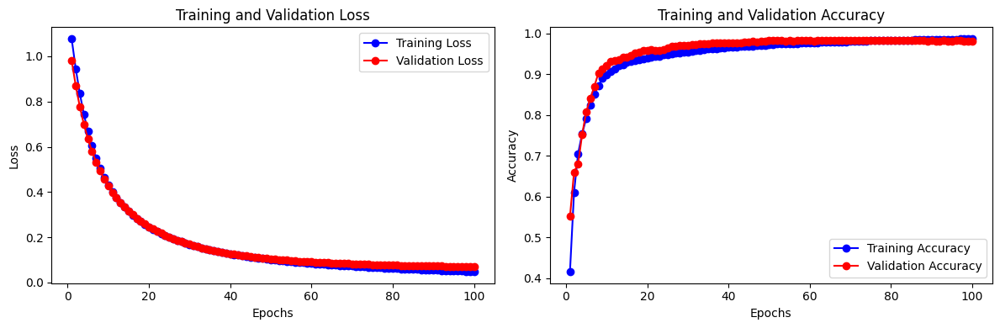

In [32]:
# Función para graficar la pérdida y la precisión
def plot_loss_accuracy(train_loss_history, train_acc_history, valid_loss_history, valid_acc_history):
    epochs = range(1, len(train_loss_history) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss_history, 'bo-', label='Training Loss')
    plt.plot(epochs, valid_loss_history, 'ro-', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc_history, 'bo-', label='Training Accuracy')
    plt.plot(epochs, valid_acc_history, 'ro-', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Cargar y graficar el historial guardado
history = torch.load('training_history.pth')
plot_loss_accuracy(
    history['train_loss'],
    history['train_acc'],
    history['valid_loss'],
    history['valid_acc']
)

# Balancear carpeta de test

In [33]:
import os

# Directorio de imágenes de test
test_dir = '/content/dataset/test'

# Obtener el conteo de imágenes por clase
class_counts = {}
for clase in clases:
    class_dir = os.path.join(test_dir, clase)
    num_images = len(os.listdir(class_dir))
    class_counts[clase] = num_images
    print(f"Inicialmente, clase {clase} tiene {num_images} imágenes")

# Encontrar la clase con menor número de imágenes
min_count = min(class_counts.values())
print(f"\nIgualando todas las clases a {min_count} imágenes...")

# Ajustar cada clase al mínimo eliminando imágenes extras
for clase in clases:
    class_dir = os.path.join(test_dir, clase)
    current_count = class_counts[clase]

    if current_count > min_count:
        # Obtener lista de archivos y ordenarlos
        files = sorted(os.listdir(class_dir))
        # Calcular cuántas imágenes eliminar
        num_to_remove = current_count - min_count
        # Eliminar las últimas imágenes
        for file_name in files[-num_to_remove:]:
            os.remove(os.path.join(class_dir, file_name))
        print(f"Se eliminaron {num_to_remove} imágenes de la clase {clase}")

# Verificar el resultado final
print("\nConteo final de imágenes de test:")
for clase in clases:
    num_images = len(os.listdir(os.path.join(test_dir, clase)))
    print(f"Clase {clase} tiene {num_images} imágenes")

Inicialmente, clase leaf_with_larva tiene 145 imágenes
Inicialmente, clase healthy_leaf tiene 145 imágenes
Inicialmente, clase damaged_leaf tiene 145 imágenes

Igualando todas las clases a 145 imágenes...

Conteo final de imágenes de test:
Clase leaf_with_larva tiene 145 imágenes
Clase healthy_leaf tiene 145 imágenes
Clase damaged_leaf tiene 145 imágenes


# Matriz de confusión

<ipython-input-34-0fe571ea5742>:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


Matriz de Confusión:
[[140   5   0]
 [  1 144   0]
 [  1   1 143]]


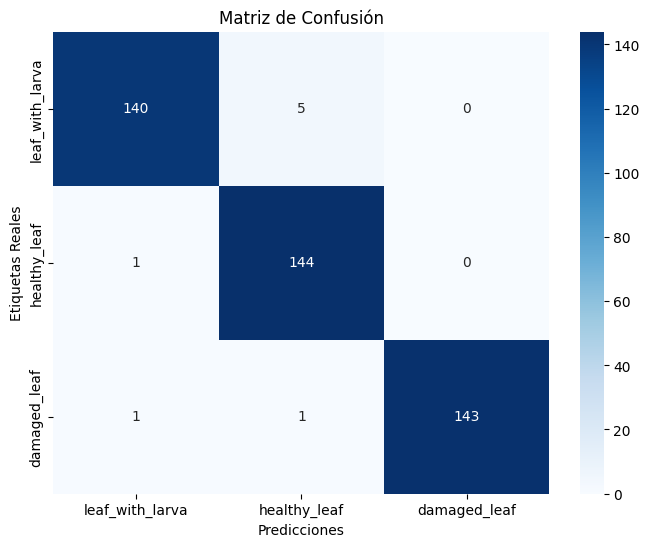

In [34]:
from sklearn.metrics import confusion_matrix
import numpy as np

def evaluate_model(model, dataloader, device):
    model.eval()
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    return all_labels, all_predictions


# Cargar el mejor modelo
model.load_state_dict(torch.load('best_model.pth'))

# Evaluar en el conjunto de prueba
all_labels, all_predictions = evaluate_model(model, test_loader, device)

# Calcular la matriz de confusión
cm = confusion_matrix(all_labels, all_predictions)

# Mostrar la matriz de confusión
print("Matriz de Confusión:")
print(cm)

# Opcional: Visualizar la matriz de confusión con un mapa de calor (usando seaborn)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=clases, yticklabels=clases)
plt.xlabel('Predicciones')
plt.ylabel('Etiquetas Reales')
plt.title('Matriz de Confusión')
plt.show()

# Codigo para guardar el modelo

In [36]:
# Guardar pesos del modelo entrenado
torch.save(model.state_dict(), 'pesos_modelo_identificacion_gusano_cogollero.pth')

# Guardar el modelo comleto
torch.save(model, 'modelo_identificacion_gusano_cogollero_completo.pth')

In [ ]:
import torch
import torch.onnx

# Cargar el modelo entrenado
model.eval()  # Asegurarse que el modelo está en modo evaluación

# Crear un ejemplo de entrada con las dimensiones correctas
# Ajusta el tamaño del batch y los canales según tu modelo
dummy_input = torch.randn(1, 3, 384, 384).to(device)

# Exportar el modelo a ONNX
torch.onnx.export(
    model,                     # Modelo PyTorch
    dummy_input,              # Entrada de ejemplo
    'modelo_gusano_cogollero.onnx',  # Nombre del archivo de salida
    export_params=True,       # Almacenar los pesos entrenados
    opset_version=14,         # Versión del conjunto de operadores ONNX
    do_constant_folding=True, # Optimización: fusionar operadores constantes
    input_names=['input'],    # Nombre de la entrada
    output_names=['output'],  # Nombre de la salida
    dynamic_axes={
        'input': {0: 'batch_size'},  # Dimensión variable para el batch
        'output': {0: 'batch_size'}
    }
)

print("Modelo exportado exitosamente a ONNX")

# Verificar el modelo ONNX (opcional)
import onnx

# Cargar y verificar el modelo ONNX
onnx_model = onnx.load('modelo_gusano_cogollero.onnx')
onnx.checker.check_model(onnx_model)
print("Modelo ONNX verificado correctamente")